In [23]:
# ==============================================================================
# SECCIÓN 1: IMPORTACIONES Y CONFIGURACIÓN
# ==============================================================================
# Importamos las bibliotecas necesarias para la manipulación de archivos,
# el procesamiento de datos numéricos y la visualización.

import os
import glob
import numpy as np
import nibabel as nib  # Biblioteca estándar para leer archivos de formato NIfTI
import matplotlib.pyplot as plt
import math
from tqdm import tqdm # Para mostrar barras de progreso
from matplotlib.colors import ListedColormap

In [2]:
# ==============================================================================
# SECCIÓN 2: DEFINICIÓN DE RUTAS Y PARÁMETROS
# ==============================================================================

# --- ¡ACCIÓN REQUERIDA! ---
# Modifica esta ruta para que apunte al directorio donde has descomprimido los datos de BraTS 2021.
# La estructura esperada es:.../BraTS2021_Training_Data/BraTS2021_XXXXX/
DATA_DIR = 'F:/Proyectos/brain_segmentation/data/BraTS2021_Training_Data/'

# Seleccionamos un ID de paciente para realizar el análisis.
# Puedes cambiar este número para explorar diferentes casos.
SAMPLE_PATIENT_ID = '00495'


In [8]:
# ==============================================================================
# SECCIÓN 3: CARGA Y ANÁLISIS DE DATOS DE UN PACIENTE
# ==============================================================================

def analyze_patient_sample(data_dir, patient_id):
    """
    Carga, analiza y visualiza los datos de un único paciente del dataset BraTS.
    """
    patient_path = os.path.join(data_dir, f'BraTS2021_{patient_id}')
    
    print(f"--- Análisis del Paciente: {patient_id} ---")
    
    if not os.path.exists(patient_path):
        print(f"Error: No se encontró el directorio para el paciente {patient_id} en la ruta especificada.")
        print(f"Ruta buscada: {patient_path}")
        return

    # --- 3.1: Carga de archivos NIfTI ---
    # Utilizamos glob para encontrar las rutas de cada modalidad de imagen y la máscara.
    # glob.glob devuelve una lista, por lo que tomamos el primer elemento .
    try:
        flair_path = glob.glob(os.path.join(patient_path, '*_flair.nii.gz'))
        t1_path = glob.glob(os.path.join(patient_path, '*_t1.nii.gz'))
        t1ce_path = glob.glob(os.path.join(patient_path, '*_t1ce.nii.gz'))
        t2_path = glob.glob(os.path.join(patient_path, '*_t2.nii.gz'))
        seg_path = glob.glob(os.path.join(patient_path, '*_seg.nii.gz'))

        # Cargamos los datos de la imagen como arrays de NumPy usando nibabel.
        flair_img = nib.load(flair_path[0]).get_fdata()
        t1_img = nib.load(t1_path[0]).get_fdata()
        t1ce_img = nib.load(t1ce_path[0]).get_fdata()
        t2_img = nib.load(t2_path[0]).get_fdata()
        seg_mask = nib.load(seg_path[0]).get_fdata()
        
    except IndexError:
        print(f"Error: No se encontraron todos los archivos NIfTI necesarios para el paciente {patient_id}.")
        print("Asegúrate de que la estructura de archivos es la correcta (e.g., BraTS2021_XXXXX_flair.nii.gz).")
        return

    # --- 3.2: Inspección de las dimensiones y metadatos ---
    print("\n1. Dimensiones de los volúmenes de MRI:")
    print(f"   - Forma de la imagen FLAIR: {flair_img.shape}")
    print(f"   - Esto significa (Ancho, Alto, Número de Cortes): {flair_img.shape}x{flair_img.shape[1]} píxeles, con {flair_img.shape[2]} cortes.")

    # --- 3.3: Análisis de la máscara de segmentación ---
    # La máscara contiene etiquetas numéricas para cada tipo de tejido tumoral.
    unique_mask_values = np.unique(seg_mask)
    print("\n2. Análisis de la Máscara de Segmentación:")
    print(f"   - Valores únicos encontrados en la máscara: {unique_mask_values}")
    print("   - Significado de las etiquetas (según el protocolo BraTS):")
    print("     - 0: Fondo (tejido sano o aire)")
    print("     - 1: Núcleo Necrótico y No Realzado (NCR/NET)")
    print("     - 2: Edema Peritumoral (ED)")
    print("     - 4: Tumor Realzado con Contraste (ET)")
    
    # --- 3.4: Selección de un corte representativo para visualizar ---
    # Buscamos un corte (slice) que contenga una cantidad significativa de tejido tumoral
    # para que la visualización sea informativa.
    # Sumamos los valores de la máscara en cada corte y encontramos el que tiene la suma máxima.
    slice_with_max_tumor = np.argmax(np.sum(seg_mask, axis=(0, 1)))
    
    print(f"\n3. Selección para Visualización:")
    print(f"   - Se ha seleccionado el corte número {slice_with_max_tumor} por tener la mayor área tumoral.")

    # --- 3.5: Visualización ---
    # Creamos una figura para mostrar el mismo corte de las 4 modalidades y la máscara.
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))
    
    modalities = {
        'FLAIR': flair_img,
        'T1': t1_img,
        'T1ce': t1ce_img,
        'T2': t2_img,
        'Máscara (Seg)': seg_mask
    }
    
    for i, (name, img_data) in enumerate(modalities.items()):
        # Rotamos la imagen 90 grados para una visualización más estándar (orientación radiológica)
        slice_to_show = np.rot90(img_data[:, :, slice_with_max_tumor])
        
        # Usamos un mapa de colores diferente para la máscara para distinguir las clases
        cmap = 'gray' if 'Máscara' not in name else 'viridis'
        
        axes[i].imshow(slice_to_show, cmap=cmap)
        axes[i].set_title(f'{name}\nCorte: {slice_with_max_tumor}')
        axes[i].axis('off') # Ocultamos los ejes para una mejor visualización
        
    plt.suptitle(f'Análisis Visual del Paciente {patient_id}', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


--- Análisis del Paciente: 00495 ---

1. Dimensiones de los volúmenes de MRI:
   - Forma de la imagen FLAIR: (240, 240, 155)
   - Esto significa (Ancho, Alto, Número de Cortes): (240, 240, 155)x240 píxeles, con 155 cortes.

2. Análisis de la Máscara de Segmentación:
   - Valores únicos encontrados en la máscara: [0. 1. 2. 4.]
   - Significado de las etiquetas (según el protocolo BraTS):
     - 0: Fondo (tejido sano o aire)
     - 1: Núcleo Necrótico y No Realzado (NCR/NET)
     - 2: Edema Peritumoral (ED)
     - 4: Tumor Realzado con Contraste (ET)

3. Selección para Visualización:
   - Se ha seleccionado el corte número 87 por tener la mayor área tumoral.


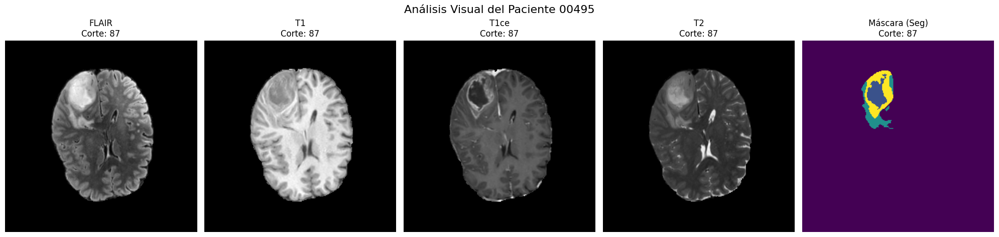

In [9]:
analyze_patient_sample(DATA_DIR, SAMPLE_PATIENT_ID)

In [17]:
def plot_all_modalities_by_slice(flair, t1, t1ce, t2, mask, patient_id):
    """
    Crea una figura que muestra todas las modalidades para cada corte del cerebro.
    Cada fila representa un corte, y cada columna una modalidad.
    """
    num_slices = flair.shape[2]
    # Creamos una figura con 6 columnas: # Corte, FLAIR, T1, T1ce, T2, Máscara
    fig, axes = plt.subplots(num_slices, 6, figsize=(18, num_slices * 3))
    
    # Títulos de las columnas
    col_titles = ['# Corte', 'FLAIR', 'T1', 'T1ce', 'T2', 'Máscara Seg.']
    for ax, title in zip(axes[0], col_titles):
        ax.set_title(title, fontsize=16, weight='bold')

    for i in range(num_slices):
        # Columna 0: Número del corte
        axes[i, 0].text(0.5, 0.5, str(i), horizontalalignment='center', verticalalignment='center', fontsize=20, weight='bold')
        axes[i, 0].axis('off')

        # Columnas 1-4: Modalidades de MRI
        modalities = [flair, t1, t1ce, t2]
        for j, modality_vol in enumerate(modalities):
            slice_to_show = np.rot90(modality_vol[:, :, i])
            axes[i, j + 1].imshow(slice_to_show, cmap='gray')
            axes[i, j + 1].axis('off')
        
        # Columna 5: Máscara de segmentación
        mask_slice_to_show = np.rot90(mask[:, :, i])
        axes[i, 5].imshow(mask_slice_to_show, cmap='viridis')
        axes[i, 5].axis('off')

    plt.suptitle(f'Visualización Completa por Cortes - Paciente {patient_id}', fontsize=24)
    # Usamos 'wspace' y 'hspace' para ajustar el espaciado
    plt.tight_layout(rect=[0, 0.03, 1, 0.97], w_pad=0.1, h_pad=0.5)
    plt.show()
# ==============================================================================
# SECCIÓN 4: CARGA Y ANÁLISIS DE DATOS DE UN PACIENTE
# ==============================================================================

def analyze_patient_sample(data_dir, patient_id):
    """
    Carga, analiza y visualiza los datos de un único paciente del dataset BraTS.
    """
    patient_path = os.path.join(data_dir, f'BraTS2021_{patient_id}')
    
    print(f"--- Análisis del Paciente: {patient_id} ---")
    
    if not os.path.exists(patient_path):
        print(f"Error: No se encontró el directorio para el paciente {patient_id} en la ruta especificada.")
        print(f"Ruta buscada: {patient_path}")
        return

    # --- 3.1: Carga de archivos NIfTI ---
    # Utilizamos glob para encontrar las rutas de cada modalidad de imagen y la máscara.
    # glob.glob devuelve una lista, por lo que tomamos el primer elemento .
    try:
        flair_path = glob.glob(os.path.join(patient_path, '*_flair.nii.gz'))
        t1_path = glob.glob(os.path.join(patient_path, '*_t1.nii.gz'))
        t1ce_path = glob.glob(os.path.join(patient_path, '*_t1ce.nii.gz'))
        t2_path = glob.glob(os.path.join(patient_path, '*_t2.nii.gz'))
        seg_path = glob.glob(os.path.join(patient_path, '*_seg.nii.gz'))

        # Cargamos los datos de la imagen como arrays de NumPy usando nibabel.
        flair_img = nib.load(flair_path[0]).get_fdata()
        t1_img = nib.load(t1_path[0]).get_fdata()
        t1ce_img = nib.load(t1ce_path[0]).get_fdata()
        t2_img = nib.load(t2_path[0]).get_fdata()
        seg_mask = nib.load(seg_path[0]).get_fdata()
        
    except IndexError:
        print(f"Error: No se encontraron todos los archivos NIfTI necesarios para el paciente {patient_id}.")
        print("Asegúrate de que la estructura de archivos es la correcta (e.g., BraTS2021_XXXXX_flair.nii.gz).")
        return

    # --- 4.2: Inspección de las dimensiones ---
    print("\n1. Dimensiones de los volúmenes de MRI:")
    print(f"   - Forma de la imagen FLAIR: {flair_img.shape}")
    print(f"   - Esto significa (Ancho, Alto, Número de Cortes): {flair_img.shape[0]}x{flair_img.shape[1]} píxeles, con {flair_img.shape[2]} cortes.")

    # --- 4.3: Análisis de la máscara de segmentación ---
    unique_mask_values = np.unique(seg_mask)
    print("\n2. Análisis de la Máscara de Segmentación:")
    print(f"   - Valores únicos encontrados en la máscara: {unique_mask_values}")
    print("   - Significado de las etiquetas (según el protocolo BraTS):")
    print("     - 0: Fondo (tejido sano o aire)")
    print("     - 1: Núcleo Necrótico y No Realzado (NCR/NET)")
    print("     - 2: Edema Peritumoral (ED)")
    print("     - 4: Tumor Realzado con Contraste (ET)")
    print("\n   - Explicación de los colores en la visualización de la máscara (cmap='viridis'):")
    print("     - Púrpura/Azul oscuro: Fondo (Valor 0)")
    print("     - Verde/Azul claro: NCR/NET (Valor 1)")
    print("     - Turquesa/Verde: Edema (Valor 2)")
    print("     - Amarillo brillante: Tumor Realzado (Valor 4)")

    # --- 4.4: Selección de un corte representativo para visualización comparativa ---
    slice_with_max_tumor = np.argmax(np.sum(seg_mask > 0, axis=(0, 1)))
    
    print(f"\n3. Selección para Visualización Comparativa:")
    print(f"   - Se ha seleccionado el corte número {slice_with_max_tumor} por tener la mayor área tumoral.")

    # --- 4.5: Visualización Comparativa de un Corte ---
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))
    modalities = {'FLAIR': flair_img, 'T1': t1_img, 'T1ce': t1ce_img, 'T2': t2_img, 'Máscara (Seg)': seg_mask}
    
    for i, (name, img_data) in enumerate(modalities.items()):
        slice_to_show = np.rot90(img_data[:, :, slice_with_max_tumor])
        cmap = 'gray' if 'Máscara' not in name else 'viridis'
        axes[i].imshow(slice_to_show, cmap=cmap)
        axes[i].set_title(f'{name}\nCorte: {slice_with_max_tumor}')
        axes[i].axis('off')
        
    plt.suptitle(f'Análisis Visual Comparativo del Paciente {patient_id}', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # --- 4.6: Análisis de Distribución de Intensidades (Histogramas) ---
    print("\n4. Generando histogramas de intensidad (solo para píxeles dentro del cerebro)...")
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    modalities_for_hist = {'FLAIR': flair_img, 'T1': t1_img, 'T1ce': t1ce_img, 'T2': t2_img}
    
    for ax, (name, img_data) in zip(axes.flatten(), modalities_for_hist.items()):
        # Se consideran solo los píxeles con valor > 0 para un histograma más representativo
        pixels = img_data[img_data > 0]
        ax.hist(pixels.flatten(), bins=100, color='skyblue', edgecolor='black')
        ax.set_title(f'Distribución de Intensidad - {name}')
        ax.set_xlabel('Valor de Intensidad del Píxel')
        ax.set_ylabel('Frecuencia')
        ax.grid(True, linestyle='--', alpha=0.6)
        
    plt.suptitle('Histogramas de Intensidad de las Modalidades de MRI', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # --- 4.7: Visualización Completa del Volumen por Cortes y Modalidades ---
    print("\n5. Generando visualización de todos los cortes por fila...")
    plot_all_modalities_by_slice(flair_img, t1_img, t1ce_img, t2_img, seg_mask, patient_id)
    return flair_img, t1ce_img, seg_mask

--- Análisis del Paciente: 00495 ---

1. Dimensiones de los volúmenes de MRI:
   - Forma de la imagen FLAIR: (240, 240, 155)
   - Esto significa (Ancho, Alto, Número de Cortes): 240x240 píxeles, con 155 cortes.

2. Análisis de la Máscara de Segmentación:
   - Valores únicos encontrados en la máscara: [0. 1. 2. 4.]
   - Significado de las etiquetas (según el protocolo BraTS):
     - 0: Fondo (tejido sano o aire)
     - 1: Núcleo Necrótico y No Realzado (NCR/NET)
     - 2: Edema Peritumoral (ED)
     - 4: Tumor Realzado con Contraste (ET)

   - Explicación de los colores en la visualización de la máscara (cmap='viridis'):
     - Púrpura/Azul oscuro: Fondo (Valor 0)
     - Verde/Azul claro: NCR/NET (Valor 1)
     - Turquesa/Verde: Edema (Valor 2)
     - Amarillo brillante: Tumor Realzado (Valor 4)

3. Selección para Visualización Comparativa:
   - Se ha seleccionado el corte número 84 por tener la mayor área tumoral.


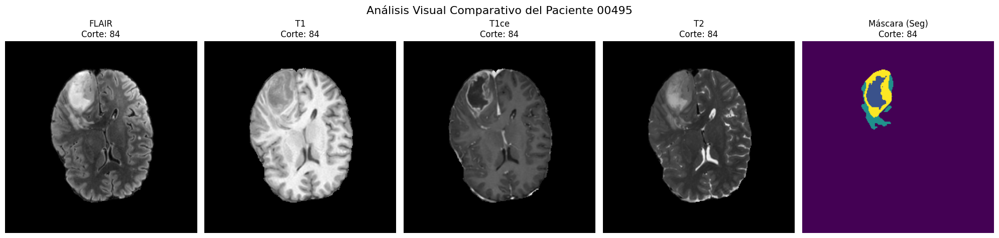


4. Generando histogramas de intensidad (solo para píxeles dentro del cerebro)...


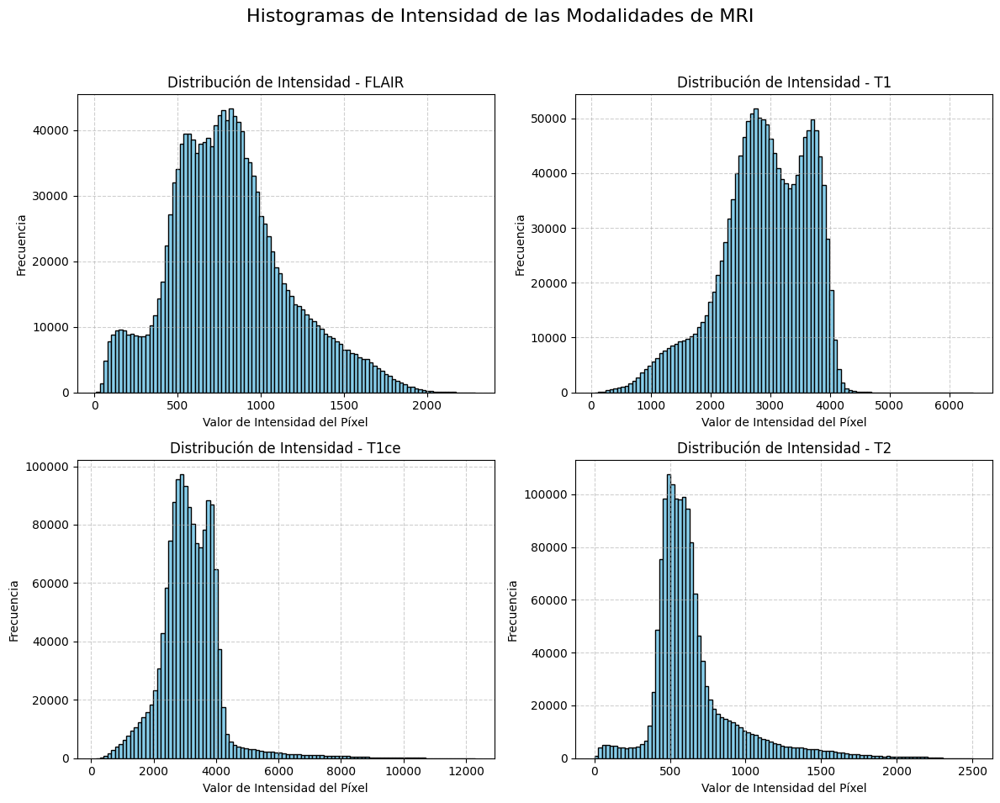


5. Generando visualización de todos los cortes por fila...


In [18]:
flair_vol, t1ce_vol, seg_mask = analyze_patient_sample(DATA_DIR, SAMPLE_PATIENT_ID)

In [19]:
def analyze_dataset_statistics(all_patient_paths):
    """
    Calcula y visualiza estadísticas a nivel de todo el dataset.
    - Distribución del tamaño del tumor.
    - Proporción de cada subregión tumoral.
    """
    print("\n--- Análisis Estadístico del Dataset Completo ---")
    
    tumor_volumes = []
    subregion_proportions = []

    for patient_path in tqdm(all_patient_paths, desc="Calculando estadísticas del dataset"):
        try:
            seg_path = glob.glob(os.path.join(patient_path, '*_seg.nii.gz'))[0]
            seg_mask = nib.load(seg_path).get_fdata()
            
            total_tumor_volume = np.sum(seg_mask > 0)
            
            if total_tumor_volume > 0:
                tumor_volumes.append(total_tumor_volume)
                
                # Calcular volumen de cada subregión
                ncr_net_volume = np.sum(seg_mask == 1)
                edema_volume = np.sum(seg_mask == 2)
                enhancing_volume = np.sum(seg_mask == 4)
                
                # Calcular proporciones
                proportions = [
                    ncr_net_volume / total_tumor_volume,
                    edema_volume / total_tumor_volume,
                    enhancing_volume / total_tumor_volume
                ]
                subregion_proportions.append(proportions)
        except (IndexError, FileNotFoundError):
            print(f"Advertencia: No se pudo procesar o encontrar la máscara para {os.path.basename(patient_path)}")
            continue

    # --- Visualización de Estadísticas ---
    
    # 1. Histograma de la distribución del tamaño del tumor
    plt.figure(figsize=(12, 6))
    plt.hist(tumor_volumes, bins=50, color='crimson', edgecolor='black')
    plt.title('Distribución del Tamaño Total del Tumor en el Dataset', fontsize=16)
    plt.xlabel('Volumen del Tumor (en número de vóxeles)')
    plt.ylabel('Número de Pacientes')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()
    print("El histograma anterior muestra la frecuencia de diferentes tamaños de tumor. Permite ver si predominan tumores pequeños o grandes.")

    # 2. Boxplot de la proporción de subregiones
    plt.figure(figsize=(12, 6))
    proportions_data = np.array(subregion_proportions)
    plt.boxplot(proportions_data, labels=['NCR/NET (Núcleo)', 'ED (Edema)', 'ET (Realzado)'])
    plt.title('Distribución de la Proporción de Subregiones Tumorales', fontsize=16)
    plt.ylabel('Proporción del Volumen Total del Tumor')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()
    print("El diagrama de cajas anterior muestra cómo se distribuye la composición de los tumores. Cada caja muestra la mediana (línea naranja), los cuartiles y el rango de las proporciones para cada tipo de tejido tumoral en todo el dataset.")




--- Análisis Estadístico del Dataset Completo ---


Calculando estadísticas del dataset: 100%|██████████| 1251/1251 [02:37<00:00,  7.92it/s]


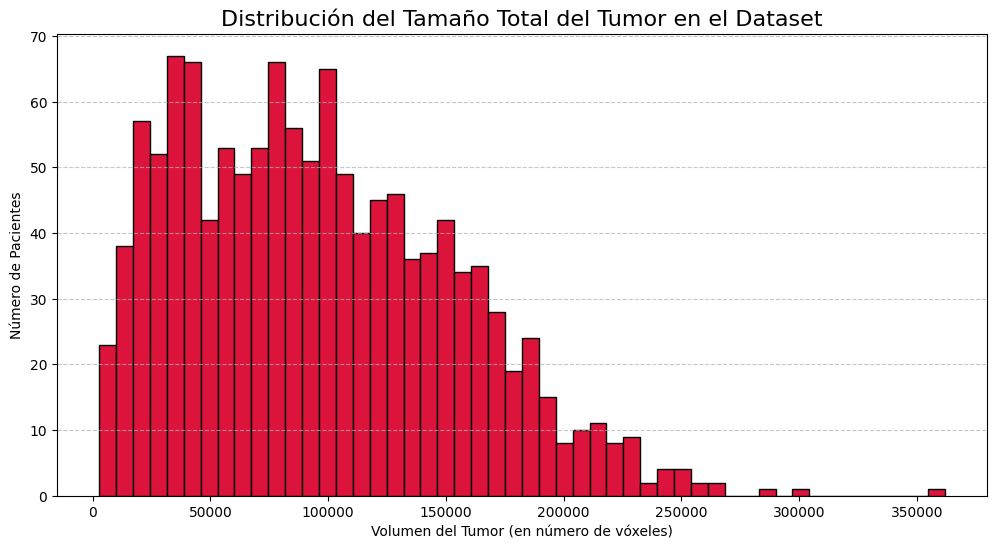

C:\Users\chris\AppData\Local\Temp\ipykernel_39696\294821120.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(proportions_data, labels=['NCR/NET (Núcleo)', 'ED (Edema)', 'ET (Realzado)'])


El histograma anterior muestra la frecuencia de diferentes tamaños de tumor. Permite ver si predominan tumores pequeños o grandes.


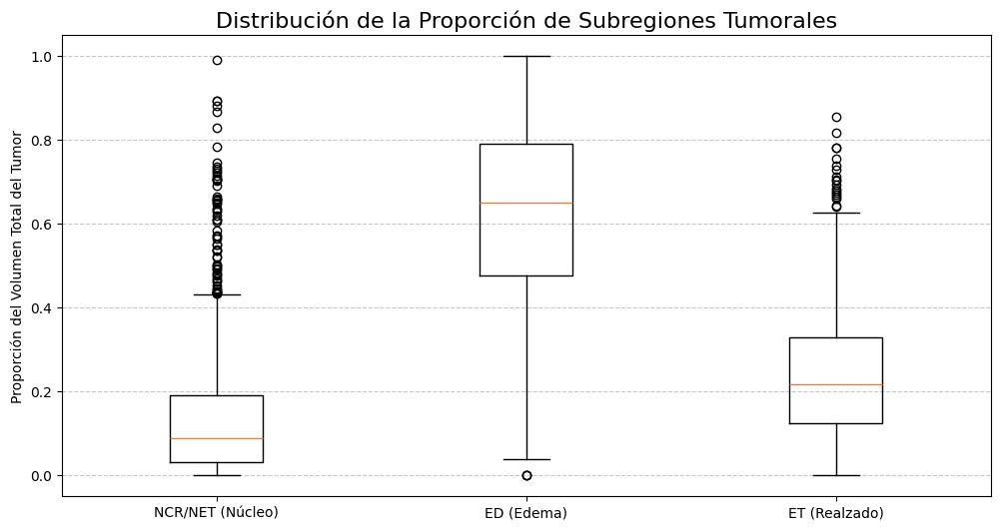

El diagrama de cajas anterior muestra cómo se distribuye la composición de los tumores. Cada caja muestra la mediana (línea naranja), los cuartiles y el rango de las proporciones para cada tipo de tejido tumoral en todo el dataset.


In [20]:
all_patients = glob.glob(os.path.join(DATA_DIR, 'BraTS2021_*'))
# Para una ejecución rápida, se puede limitar el número de pacientes:
# all_patients = all_patients[:100] 
analyze_dataset_statistics(all_patients)

In [21]:
def analyze_advanced_visualizations(flair_vol, t1ce_vol, seg_mask, patient_id):
    """
    Genera visualizaciones avanzadas para un paciente:
    - Superposición de la máscara sobre la imagen FLAIR.
    - Visualización de las etiquetas compuestas (WT, TC, ET).
    """
    print(f"\n--- Visualizaciones de Imágenes Avanzadas para el Paciente {patient_id} ---")

    # Seleccionar el corte con la mayor área tumoral para la visualización
    slice_idx = np.argmax(np.sum(seg_mask > 0, axis=(0, 1)))
    print(f"Mostrando visualizaciones para el corte más representativo: {slice_idx}")

    flair_slice = np.rot90(flair_vol[:, :, slice_idx])
    t1ce_slice = np.rot90(t1ce_vol[:, :, slice_idx])
    mask_slice = np.rot90(seg_mask[:, :, slice_idx])

    # --- 1. Superposición de la Máscara ---
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.imshow(flair_slice, cmap='gray')
    
    # Crear un colormap personalizado con transparencia
    # 0: Transparente, 1: Rojo (NCR), 2: Verde (ED), 4: Azul (ET)
    # El valor 3 no se usa, pero lo definimos por completitud
    cmap = ListedColormap(['none', 'red', 'green', 'cyan', 'blue'])
    
    # Superponer la máscara. El fondo (valor 0) será transparente.
    masked_data = np.ma.masked_where(mask_slice == 0, mask_slice)
    ax.imshow(masked_data, cmap=cmap, alpha=0.5)
    ax.set_title('Superposición de Máscara de Segmentación sobre FLAIR', fontsize=14)
    ax.axis('off')
    plt.show()
    print("La visualización anterior muestra las regiones tumorales coloreadas superpuestas en la imagen FLAIR para un mejor contexto anatómico.")

    # --- 2. Visualización de Etiquetas Clínicas Compuestas ---
    # WT: Tumor Completo (NCR + ED + ET) -> Etiquetas 1, 2, 4
    wt_mask = (mask_slice == 1) | (mask_slice == 2) | (mask_slice == 4)
    # TC: Núcleo del Tumor (NCR + ET) -> Etiquetas 1, 4
    tc_mask = (mask_slice == 1) | (mask_slice == 4)
    # ET: Tumor Realzado -> Etiqueta 4
    et_mask = (mask_slice == 4)

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    # Imagen de referencia (T1ce es buena para TC y ET)
    axes[0].imshow(t1ce_slice, cmap='gray')
    axes[0].set_title('Imagen T1ce (Referencia)', fontsize=12)
    axes[0].axis('off')

    # Tumor Completo (WT)
    axes[1].imshow(t1ce_slice, cmap='gray')
    axes[1].imshow(np.ma.masked_where(~wt_mask, wt_mask), cmap='Oranges', alpha=0.6)
    axes[1].set_title('Tumor Completo (WT)', fontsize=12)
    axes[1].axis('off')

    # Núcleo del Tumor (TC)
    axes[2].imshow(t1ce_slice, cmap='gray')
    axes[2].imshow(np.ma.masked_where(~tc_mask, tc_mask), cmap='Reds', alpha=0.6)
    axes[2].set_title('Núcleo del Tumor (TC)', fontsize=12)
    axes[2].axis('off')

    # Tumor Realzado (ET)
    axes[3].imshow(t1ce_slice, cmap='gray')
    axes[3].imshow(np.ma.masked_where(~et_mask, et_mask), cmap='cool', alpha=0.6)
    axes[3].set_title('Tumor Realzado (ET)', fontsize=12)
    axes[3].axis('off')

    plt.suptitle('Visualización de las Etiquetas Clínicas Compuestas', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    print("La visualización anterior descompone el tumor en las 3 regiones que se usan para la evaluación: WT, TC y ET. Esto ayuda a entender su estructura jerárquica.")




--- Visualizaciones de Imágenes Avanzadas para el Paciente 00495 ---
Mostrando visualizaciones para el corte más representativo: 84


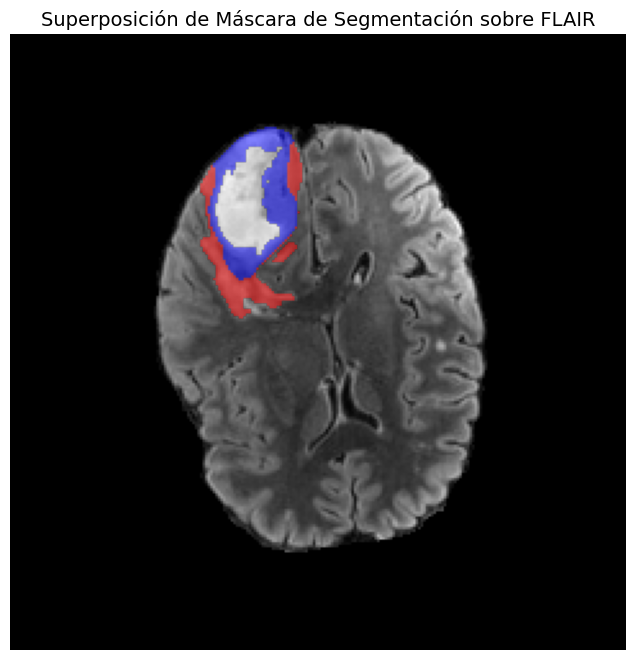

La visualización anterior muestra las regiones tumorales coloreadas superpuestas en la imagen FLAIR para un mejor contexto anatómico.


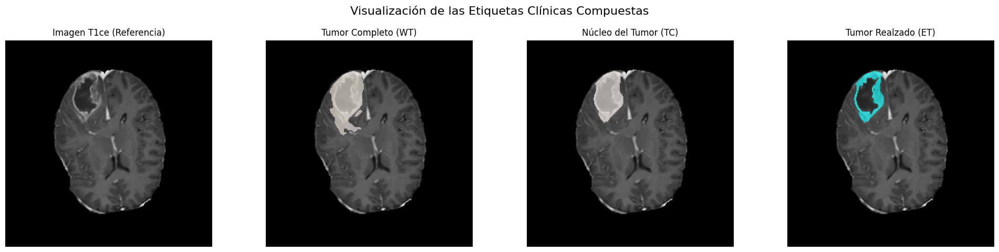

La visualización anterior descompone el tumor en las 3 regiones que se usan para la evaluación: WT, TC y ET. Esto ayuda a entender su estructura jerárquica.


In [24]:
analyze_advanced_visualizations(flair_vol, t1ce_vol, seg_mask, SAMPLE_PATIENT_ID)